In [40]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from patchify import patchify

# Define constants
PATCH_SIZE = 256
DATASET_DIR_1 = "client_data/Y2B_23"  # First dataset location
DATASET_DIR_2 = "client_data/Y2B_24"  # Second dataset location
OUTPUT_DIR = "dataset_patched2"  # Directory for storing processed patches
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [41]:
# Function to detect and crop Petri dishes from images and their masks
def detect_and_crop_petri_dish_with_masks(image_path, mask_paths):
    image = cv2.imread(image_path, 0)  # Grayscale
    original_image = cv2.imread(image_path)  # Original for cropping

    blurred = cv2.medianBlur(image, 5)
    _, output_im = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY)

    kernel = np.ones((9, 9), np.uint8)
    im_d = cv2.dilate(output_im, kernel, iterations=3)
    im_closing = cv2.erode(im_d, kernel, iterations=4)

    contours, _ = cv2.findContours(im_closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return original_image, []
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)

    size = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2
    x_start, y_start = x_center - size // 2, y_center - size // 2
    x_end, y_end = x_start + size, y_start + size

    cropped_image = original_image[max(0, y_start):min(image.shape[0], y_end), 
                                   max(0, x_start):min(image.shape[1], x_end)]
    cropped_masks = []
    for mask_path in mask_paths:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is not None:
            cropped_mask = mask[max(0, y_start):min(mask.shape[0], y_end), 
                                max(0, x_start):min(mask.shape[1], x_end)]
            cropped_masks.append(cropped_mask)

    return cropped_image, cropped_masks

In [42]:
# Build mask index for Y2B_24
mask_dir_Y2B_24 = os.path.join(DATASET_DIR_2, "masks")
mask_index_Y2B_24 = {}
for subfolder in os.listdir(mask_dir_Y2B_24):
    subfolder_path = os.path.join(mask_dir_Y2B_24, subfolder)
    for mask_name in os.listdir(subfolder_path):
        mask_base_name = os.path.splitext(mask_name)[0]
        mask_index_Y2B_24[mask_base_name] = os.path.join(subfolder_path, mask_name)

In [43]:
# Function to process and save patches
def create_patches_and_save(image_dir, mask_dir, output_dir, patch_size, dataset_type, is_Y2B_24=False):
    """
    Processes images and their corresponding masks, crops them based on the Petri dish, 
    and divides them into patches, saving the results.

    Parameters:
        image_dir: Path to the images directory (train or test).
        mask_dir: Path to the masks directory.
        output_dir: Path where patches will be saved.
        patch_size: Size of patches.
        dataset_type: Either 'train' or 'val' to locate subdirectories.
        is_Y2B_24: Boolean indicating if the dataset is Y2B_24.
    """
    if dataset_type == "train":
        image_output_dir = os.path.join(output_dir, "train_images", "train")
        mask_output_dir = os.path.join(output_dir, "train_masks", "train")
    else:
        image_output_dir = os.path.join(output_dir, "val_images", "val")
        mask_output_dir = os.path.join(output_dir, "val_masks", "val")

    os.makedirs(image_output_dir, exist_ok=True)
    os.makedirs(mask_output_dir, exist_ok=True)

    for image_name in os.listdir(image_dir):
        if not image_name.endswith(".png"):
            continue

        image_path = os.path.join(image_dir, image_name)
        base_name = os.path.splitext(image_name)[0]

        # Collect masks
        if is_Y2B_24:
            mask_paths = [
                mask_index_Y2B_24.get(base_name, None)
            ]
            mask_paths = [path for path in mask_paths if path is not None]
        else:
            mask_paths = [
                os.path.join(mask_dir, f"{base_name}_shoot_mask.tif"),
                os.path.join(mask_dir, f"{base_name}_seed_mask.tif"),
                os.path.join(mask_dir, f"{base_name}_root_mask.tif")
            ]
            mask_paths = [path for path in mask_paths if os.path.exists(path)]

        # Crop the image and masks
        cropped_image, cropped_masks = detect_and_crop_petri_dish_with_masks(image_path, mask_paths)

        # Pad and divide into patches
        height, width = cropped_image.shape[:2]
        pad_h = (patch_size - height % patch_size) % patch_size
        pad_w = (patch_size - width % patch_size) % patch_size

        padded_image = np.pad(cropped_image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
        padded_masks = [
            np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant') for mask in cropped_masks
        ]

        image_patches = patchify(padded_image, (patch_size, patch_size, 3), step=patch_size)
        mask_patches = [patchify(mask, (patch_size, patch_size), step=patch_size) for mask in cropped_masks]

        for i in range(image_patches.shape[0]):
            for j in range(image_patches.shape[1]):
                image_patch = image_patches[i, j, 0]
                combined_mask_patch = np.zeros((patch_size, patch_size), dtype=np.uint8)

                for mask_patch in mask_patches:
                    if i < mask_patch.shape[0] and j < mask_patch.shape[1]:
                        combined_mask_patch = cv2.bitwise_or(combined_mask_patch, mask_patch[i, j])

                # Scale the mask to 0-255 for saving
                combined_mask_patch = (combined_mask_patch * 255).astype(np.uint8)

                patch_name = f"{base_name}_{i}_{j}.png"

                # Save the image and mask patches
                cv2.imwrite(os.path.join(image_output_dir, patch_name), image_patch)
                cv2.imwrite(os.path.join(mask_output_dir, patch_name), combined_mask_patch)

In [44]:
# Apply the function to both datasets
# For Y2B_23
data_dirs = [(os.path.join(DATASET_DIR_1, "images", "train"), os.path.join(DATASET_DIR_1, "masks"), "train", False),
             (os.path.join(DATASET_DIR_1, "images", "test"), os.path.join(DATASET_DIR_1, "masks"), "test", False)]

# For Y2B_24
data_dirs += [(os.path.join(DATASET_DIR_2, "images"), mask_dir_Y2B_24, "train", True),
              (os.path.join(DATASET_DIR_2, "images"), mask_dir_Y2B_24, "test", True)]

for image_dir, mask_dir, dataset_type, is_Y2B_24 in data_dirs:
    create_patches_and_save(
        image_dir=image_dir,
        mask_dir=mask_dir,
        output_dir=OUTPUT_DIR,
        patch_size=PATCH_SIZE,
        dataset_type=dataset_type,
        is_Y2B_24=is_Y2B_24,
    )

In [45]:
# Helper function to display random patches
def display_random_patch(output_dir, dataset_type="train"):
    """
    Displays a random image patch, its corresponding mask, and the overlay for verification.
    """
    if dataset_type == "train":
        image_dir = os.path.join(output_dir, "train_images", "train")
        mask_dir = os.path.join(output_dir, "train_masks", "train")
    else:
        image_dir = os.path.join(output_dir, "val_images", "val")
        mask_dir = os.path.join(output_dir, "val_masks", "val")

    random_image_name = np.random.choice(os.listdir(image_dir))
    image_path = os.path.join(image_dir, random_image_name)
    mask_path = os.path.join(mask_dir, random_image_name)

    # Read the image and mask
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Create overlay
    overlay = image.copy()
    overlay[mask > 0] = [255, 0, 0]  # Highlight mask in red

    # Plot results
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Patch")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Mask Patch")
    axes[1].axis("off")

    axes[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Overlay")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

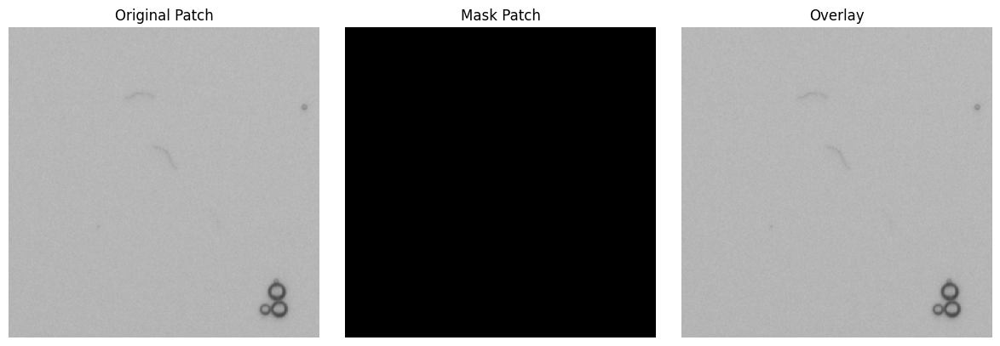

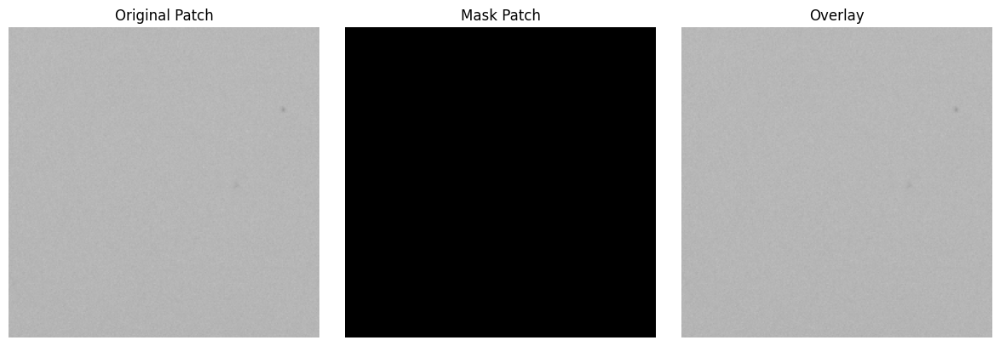

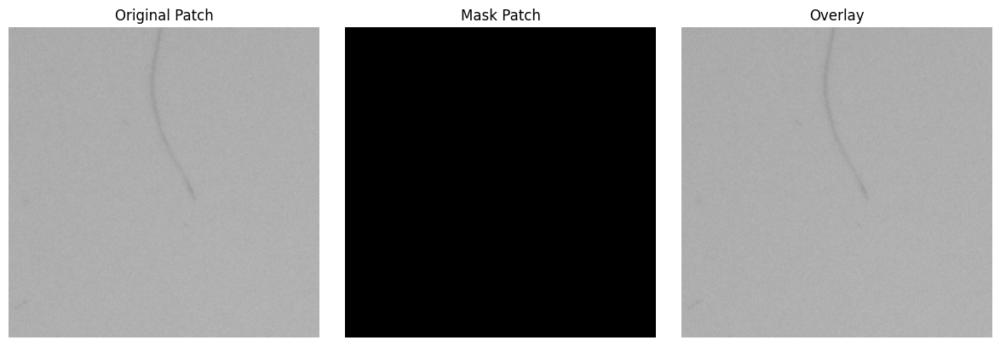

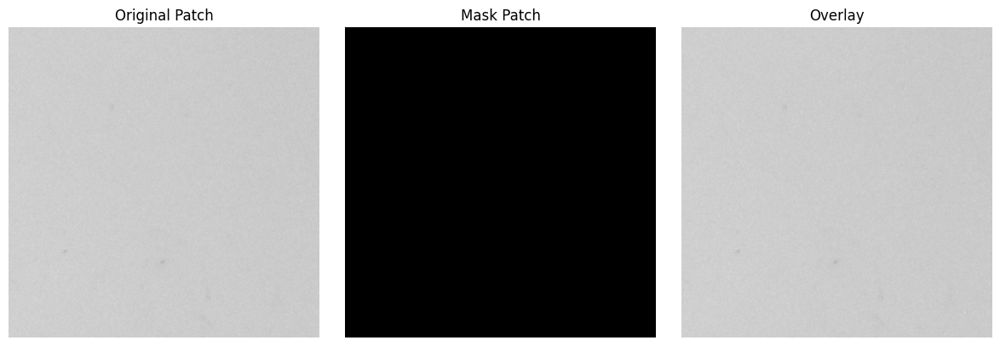

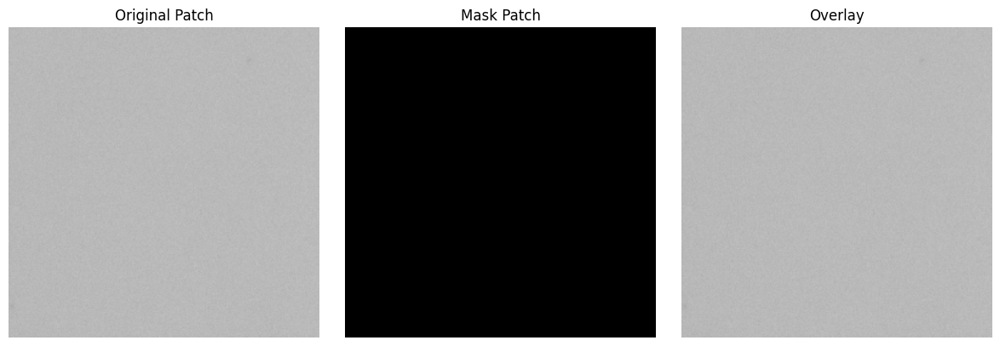

...

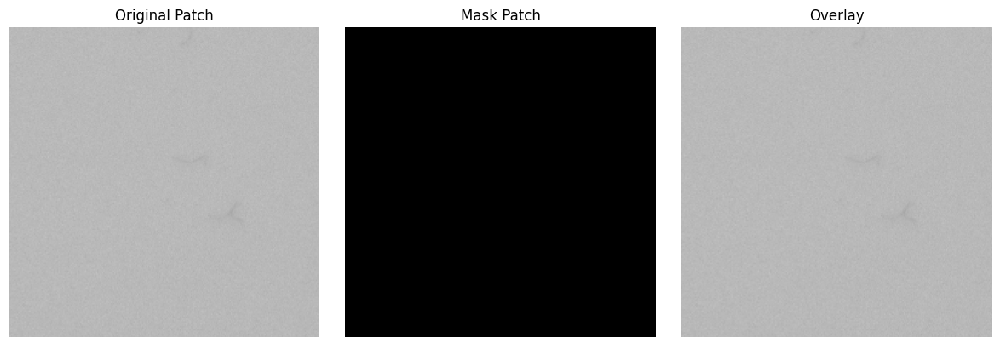

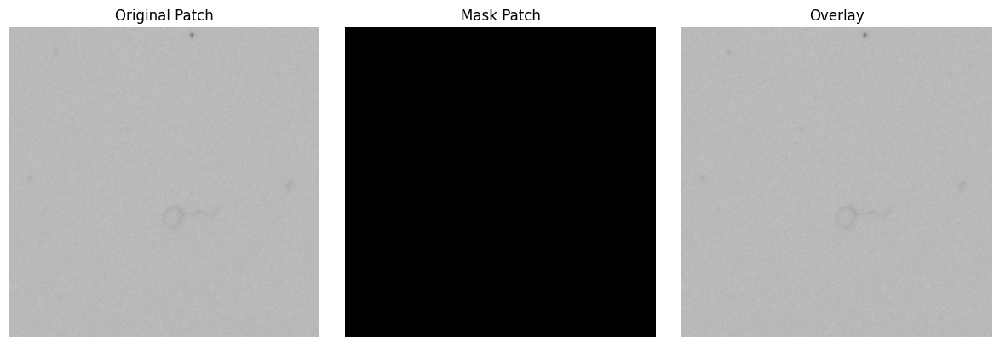

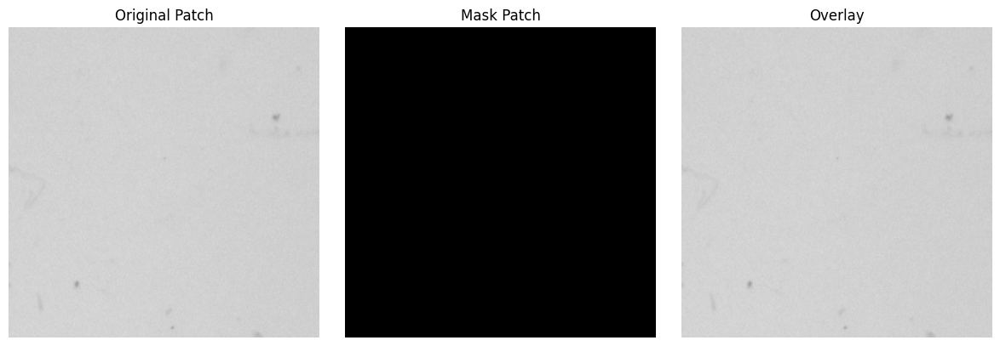

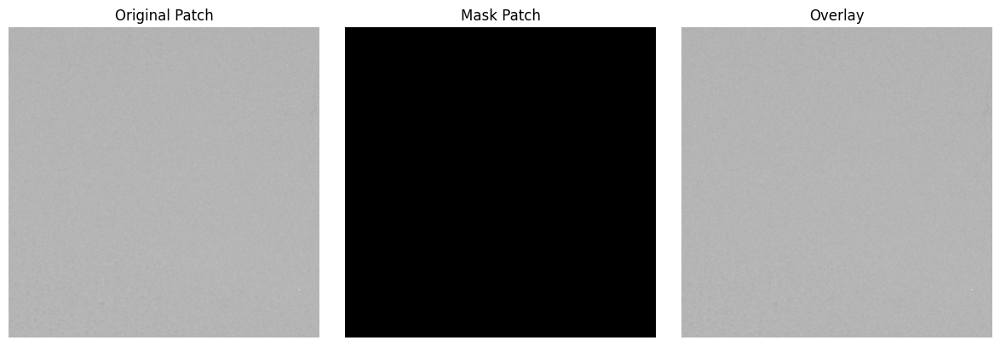

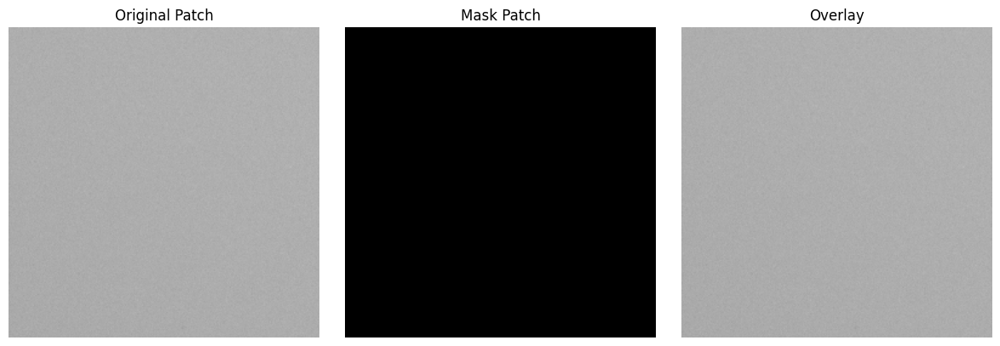

In [50]:
# Display random patches for verification
for _ in range(25):
    display_random_patch(OUTPUT_DIR, dataset_type="train")


In [10]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from patchify import patchify

# Constants
PATCH_SIZE = 256
DATASET_DIR_1 = "client_data/Y2B_23"
DATASET_DIR_2 = "client_data/Y2B_24"
OUTPUT_DIR = "dataset_patched_only_marked"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Helper: Build mask index for Y2B_24 with nested folders
def build_mask_index(mask_dir):
    mask_index = {}
    for subfolder in os.listdir(mask_dir):
        subfolder_path = os.path.join(mask_dir, subfolder)
        for mask_name in os.listdir(subfolder_path):
            if "root_mask" in mask_name:
                base_name = mask_name.replace("_root_mask.tif", "")
                mask_index[base_name] = os.path.join(subfolder_path, mask_name)
    return mask_index

# Detect and crop Petri dishes
def detect_and_crop(image_path, mask_paths):
    image = cv2.imread(image_path)
    if image is None:
        return None, []
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.medianBlur(gray, 5)
    _, thresh = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        return None, []
    
    x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
    cropped_image = image[y:y+h, x:x+w]
    cropped_masks = [cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)[y:y+h, x:x+w] for mask_path in mask_paths]
    return cropped_image, cropped_masks

# Save valid patches
def save_patches(image, masks, output_image_dir, output_mask_dir, base_name):
    height, width = image.shape[:2]
    pad_h = (PATCH_SIZE - height % PATCH_SIZE) % PATCH_SIZE
    pad_w = (PATCH_SIZE - width % PATCH_SIZE) % PATCH_SIZE
    
    image_padded = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    masks_padded = [np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant') for mask in masks]
    
    image_patches = patchify(image_padded, (PATCH_SIZE, PATCH_SIZE, 3), step=PATCH_SIZE)
    mask_patches = [patchify(mask, (PATCH_SIZE, PATCH_SIZE), step=PATCH_SIZE) for mask in masks_padded]
    
    for i in range(image_patches.shape[0]):
        for j in range(image_patches.shape[1]):
            img_patch = image_patches[i, j, 0]
            mask_patch_combined = np.zeros((PATCH_SIZE, PATCH_SIZE), dtype=np.uint8)
            
            for mask_patch in mask_patches:
                mask_patch_combined = cv2.bitwise_or(mask_patch_combined, mask_patch[i, j])
            
            if np.count_nonzero(mask_patch_combined) > 0:  # Save only non-empty masks
                patch_name = f"{base_name}_{i}_{j}.png"
                cv2.imwrite(os.path.join(output_image_dir, patch_name), img_patch)
                cv2.imwrite(os.path.join(output_mask_dir, patch_name), mask_patch_combined)

# Process dataset
def process_dataset(images_dir, masks_dir, output_dir, dataset_type, mask_index=None, name_filter=None):
    output_image_dir = os.path.join(output_dir, f"{dataset_type}_images", dataset_type)
    output_mask_dir = os.path.join(output_dir, f"{dataset_type}_masks", dataset_type)
    os.makedirs(output_image_dir, exist_ok=True)
    os.makedirs(output_mask_dir, exist_ok=True)
    
    for image_name in os.listdir(images_dir):
        if not image_name.endswith(".png") or (name_filter and not image_name.startswith(name_filter)):
            continue
        
        base_name = os.path.splitext(image_name)[0]
        image_path = os.path.join(images_dir, image_name)
        
        if mask_index:  # For Y2B_24
            mask_paths = [mask_index.get(base_name, "")]
        else:  # For Y2B_23
            mask_paths = [os.path.join(masks_dir, f"{base_name}_root_mask.tif")]
        
        mask_paths = [path for path in mask_paths if os.path.exists(path)]
        if not mask_paths:
            continue
        
        cropped_image, cropped_masks = detect_and_crop(image_path, mask_paths)
        if cropped_image is not None and any(np.count_nonzero(mask) > 0 for mask in cropped_masks):
            save_patches(cropped_image, cropped_masks, output_image_dir, output_mask_dir, base_name)

# Build mask index for Y2B_24
mask_index_Y2B_24 = build_mask_index(os.path.join(DATASET_DIR_2, "masks"))

# Process datasets
# 1. Train: All Y2B_23 + train_ from Y2B_24
process_dataset(
    images_dir=os.path.join(DATASET_DIR_1, "images", "train"),
    masks_dir=os.path.join(DATASET_DIR_1, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train"
)
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train",
    mask_index=mask_index_Y2B_24,
    name_filter="train_"
)
# 2. Validation: val_ from Y2B_24
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="val",
    mask_index=mask_index_Y2B_24,
    name_filter="val_"
)


# Helper function to display random patches
def display_random_patch(output_dir, dataset_type="train"):
    if dataset_type == "train":
        image_dir = os.path.join(output_dir, "train_images", "train")
        mask_dir = os.path.join(output_dir, "train_masks", "train")
    else:
        image_dir = os.path.join(output_dir, "val_images", "val")
        mask_dir = os.path.join(output_dir, "val_masks", "val")

    random_image_name = np.random.choice(os.listdir(image_dir))
    image_path = os.path.join(image_dir, random_image_name)
    mask_path = os.path.join(mask_dir, random_image_name)

    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Overlay
    overlay = image.copy()
    overlay[mask > 0] = [255, 0, 0]  # Red mask

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Patch")
    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Mask Patch")
    axes[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Overlay")
    plt.tight_layout()
    plt.show()

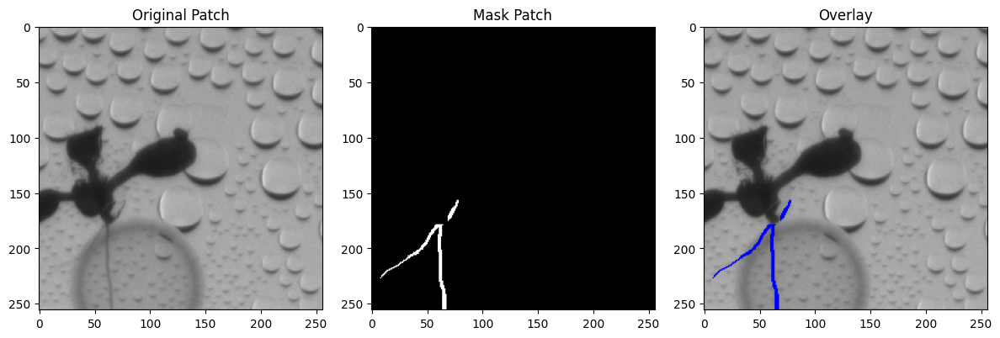

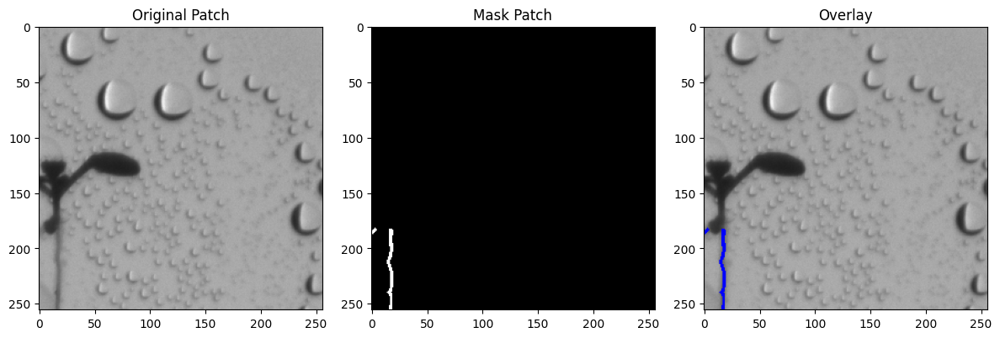

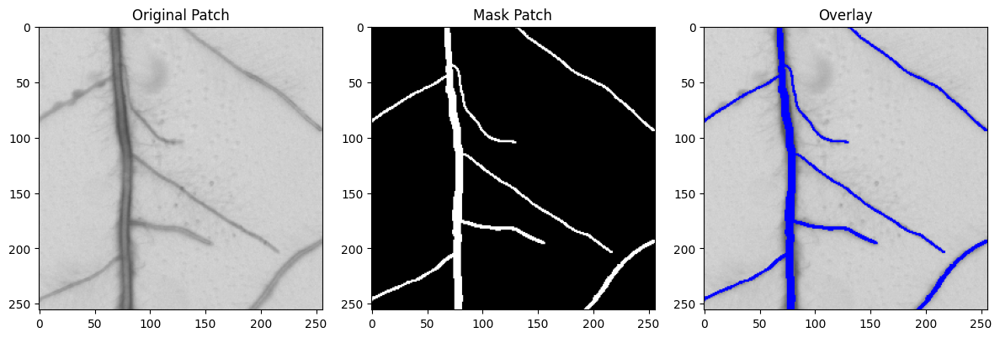

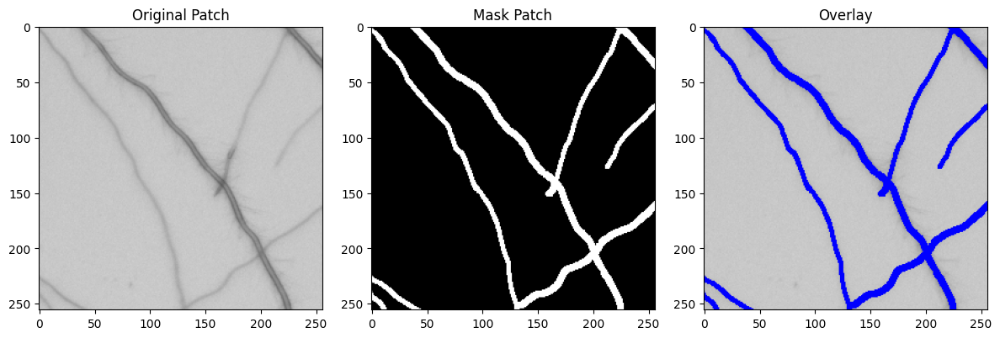

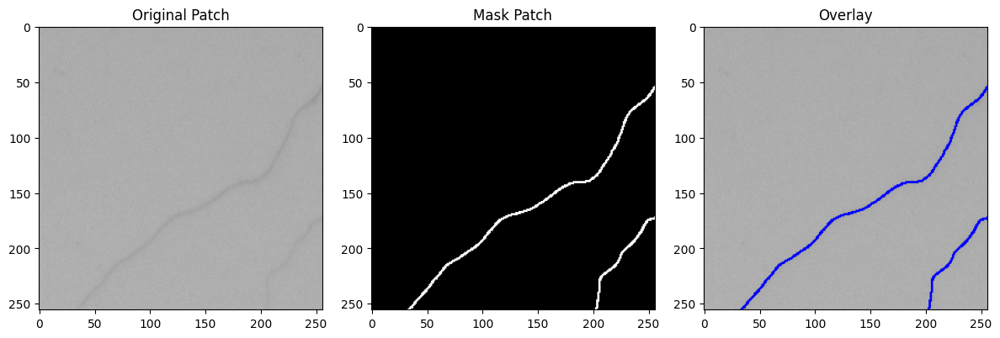

...

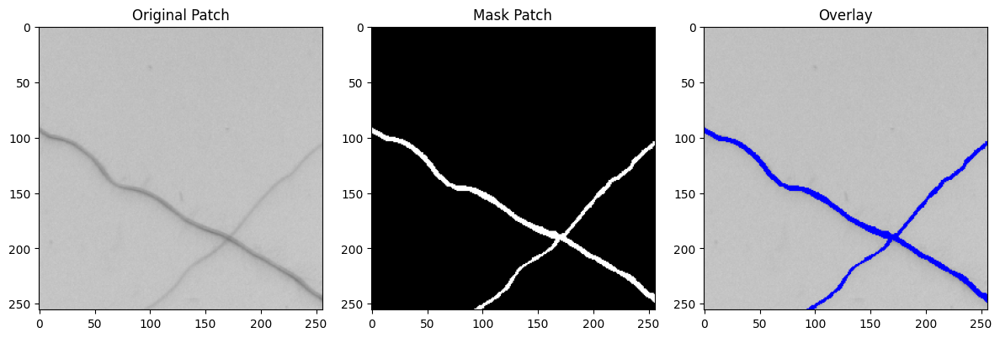

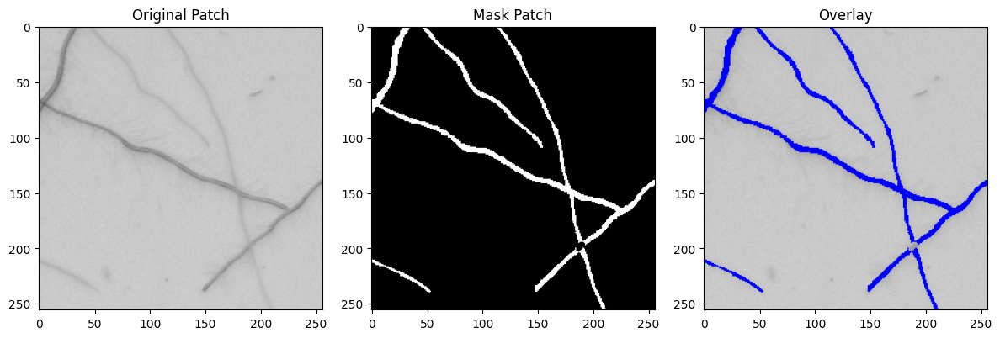

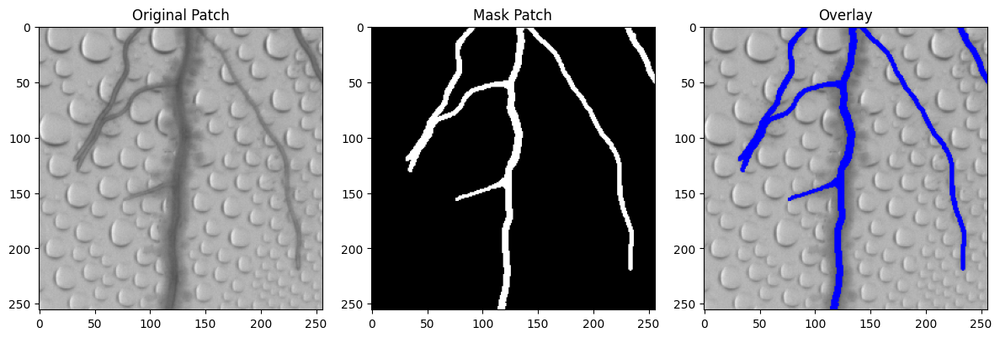

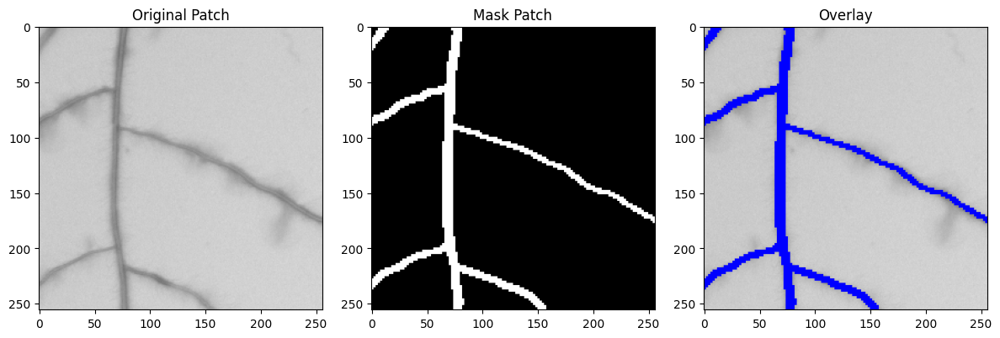

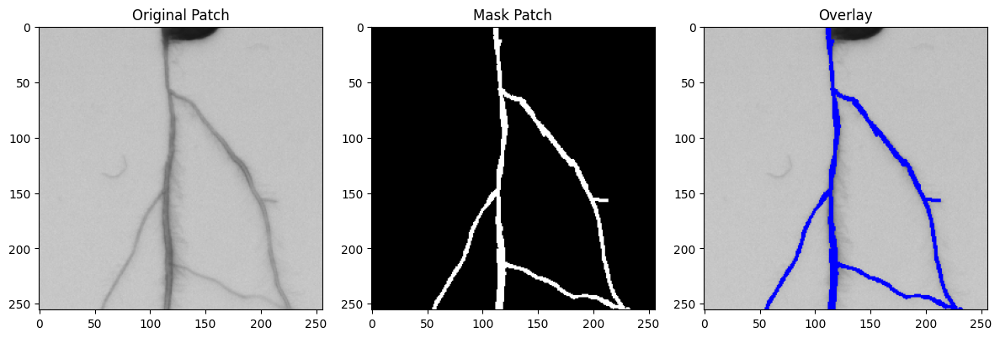

In [11]:
# Display 25 random patches for verification
for _ in range(25):
    display_random_patch(OUTPUT_DIR, dataset_type="train")

In [13]:
import os
import cv2
import numpy as np
from patchify import patchify

# Constants
PATCH_SIZE = 256
DATASET_DIR_1 = "client_data/Y2B_23"
DATASET_DIR_2 = "client_data/Y2B_24"
OUTPUT_DIR = "dataset_patched"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Helper: Build mask index for Y2B_24 with nested folders
def build_mask_index(mask_dir):
    mask_index = {}
    for subfolder in os.listdir(mask_dir):
        subfolder_path = os.path.join(mask_dir, subfolder)
        for mask_name in os.listdir(subfolder_path):
            if "root_mask" in mask_name:
                base_name = mask_name.replace("_root_mask.tif", "")
                mask_index[base_name] = os.path.join(subfolder_path, mask_name)
    return mask_index

# Detect and crop Petri dishes
def detect_and_crop(image_path, mask_paths):
    image = cv2.imread(image_path)
    if image is None:
        return None, []
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.medianBlur(gray, 5)
    _, thresh = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        return None, []
    
    x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
    cropped_image = image[y:y+h, x:x+w]
    cropped_masks = [cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)[y:y+h, x:x+w] for mask_path in mask_paths]
    
    # Check if any mask has non-zero pixels
    if all(np.count_nonzero(mask) == 0 for mask in cropped_masks):
        return None, []  # Discard the entire image if all masks are empty
    
    return cropped_image, cropped_masks

# Save all patches
def save_patches(image, masks, output_image_dir, output_mask_dir, base_name):
    height, width = image.shape[:2]
    pad_h = (PATCH_SIZE - height % PATCH_SIZE) % PATCH_SIZE
    pad_w = (PATCH_SIZE - width % PATCH_SIZE) % PATCH_SIZE
    
    image_padded = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    masks_padded = [np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant') for mask in masks]
    
    image_patches = patchify(image_padded, (PATCH_SIZE, PATCH_SIZE, 3), step=PATCH_SIZE)
    mask_patches = [patchify(mask, (PATCH_SIZE, PATCH_SIZE), step=PATCH_SIZE) for mask in masks_padded]
    
    for i in range(image_patches.shape[0]):
        for j in range(image_patches.shape[1]):
            img_patch = image_patches[i, j, 0]
            mask_patch_combined = np.zeros((PATCH_SIZE, PATCH_SIZE), dtype=np.uint8)
            
            for mask_patch in mask_patches:
                mask_patch_combined = cv2.bitwise_or(mask_patch_combined, mask_patch[i, j])
            
            patch_name = f"{base_name}_{i}_{j}.png"
            cv2.imwrite(os.path.join(output_image_dir, patch_name), img_patch)
            cv2.imwrite(os.path.join(output_mask_dir, patch_name), mask_patch_combined)

# Process dataset
def process_dataset(images_dir, masks_dir, output_dir, dataset_type, mask_index=None, name_filter=None):
    output_image_dir = os.path.join(output_dir, f"{dataset_type}_images", dataset_type)
    output_mask_dir = os.path.join(output_dir, f"{dataset_type}_masks", dataset_type)
    os.makedirs(output_image_dir, exist_ok=True)
    os.makedirs(output_mask_dir, exist_ok=True)
    
    for image_name in os.listdir(images_dir):
        if not image_name.endswith(".png") or (name_filter and not image_name.startswith(name_filter)):
            continue
        
        base_name = os.path.splitext(image_name)[0]
        image_path = os.path.join(images_dir, image_name)
        
        if mask_index:  # For Y2B_24
            mask_paths = [mask_index.get(base_name, "")]
        else:  # For Y2B_23
            mask_paths = [os.path.join(masks_dir, f"{base_name}_root_mask.tif")]
        
        mask_paths = [path for path in mask_paths if os.path.exists(path)]
        if not mask_paths:
            continue
        
        cropped_image, cropped_masks = detect_and_crop(image_path, mask_paths)
        if cropped_image is not None:  # Save patches only if valid masks exist
            save_patches(cropped_image, cropped_masks, output_image_dir, output_mask_dir, base_name)

# Build mask index for Y2B_24
mask_index_Y2B_24 = build_mask_index(os.path.join(DATASET_DIR_2, "masks"))

# Process datasets
# 1. Train: All Y2B_23 + train_ from Y2B_24
process_dataset(
    images_dir=os.path.join(DATASET_DIR_1, "images", "train"),
    masks_dir=os.path.join(DATASET_DIR_1, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train"
)
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train",
    mask_index=mask_index_Y2B_24,
    name_filter="train_"
)
# 2. Validation: val_ from Y2B_24
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="val",
    mask_index=mask_index_Y2B_24,
    name_filter="val_"
)

# Helper function to display random patches
def display_random_patch(output_dir, dataset_type="train"):
    if dataset_type == "train":
        image_dir = os.path.join(output_dir, "train_images", "train")
        mask_dir = os.path.join(output_dir, "train_masks", "train")
    else:
        image_dir = os.path.join(output_dir, "val_images", "val")
        mask_dir = os.path.join(output_dir, "val_masks", "val")

    random_image_name = np.random.choice(os.listdir(image_dir))
    image_path = os.path.join(image_dir, random_image_name)
    mask_path = os.path.join(mask_dir, random_image_name)

    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Overlay
    overlay = image.copy()
    overlay[mask > 0] = [255, 0, 0]  # Red mask

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Patch")
    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Mask Patch")
    axes[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Overlay")
    plt.tight_layout()
    plt.show()

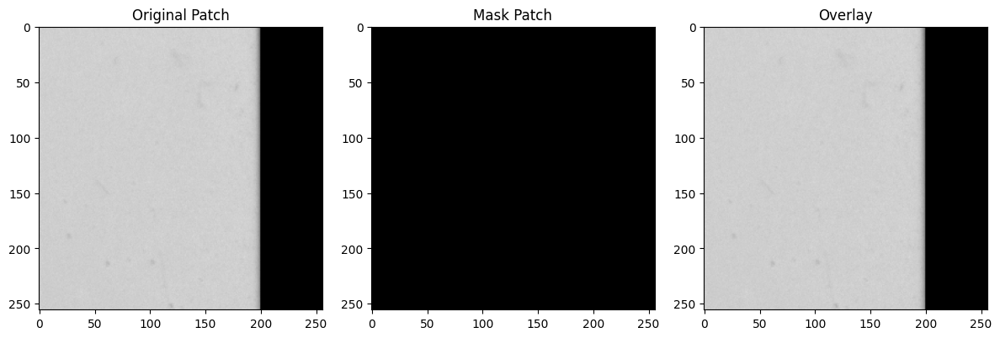

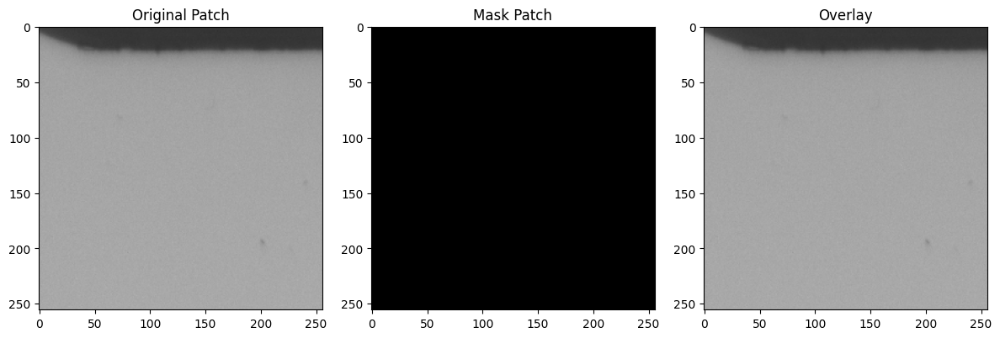

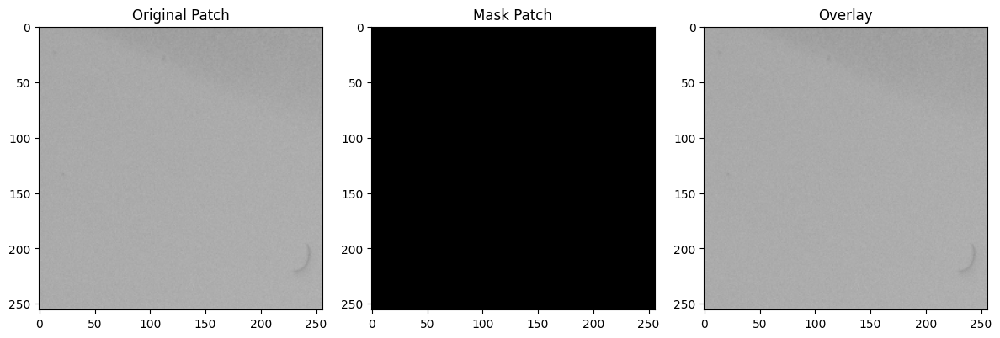

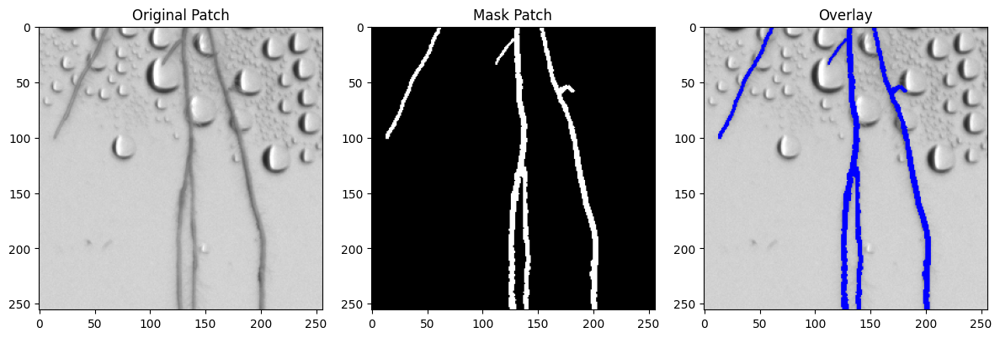

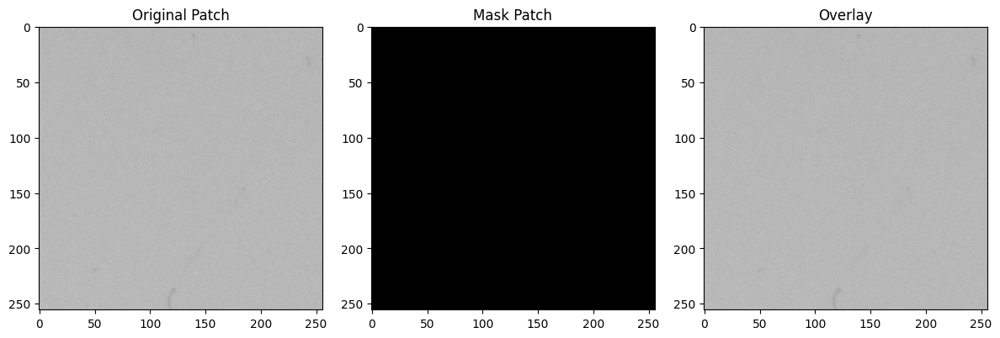

...

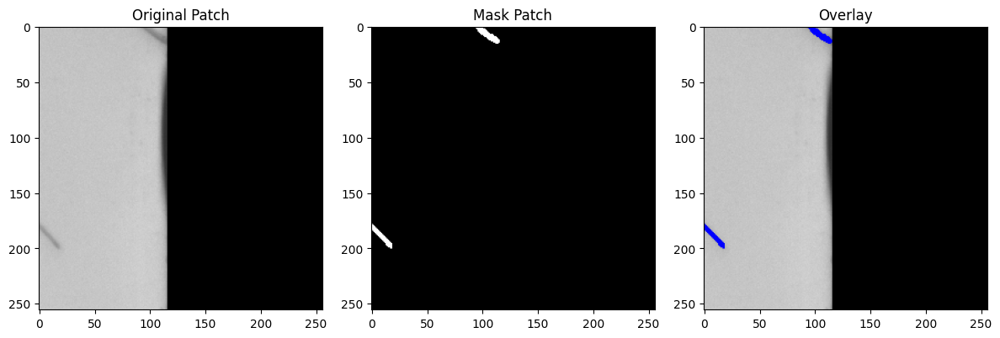

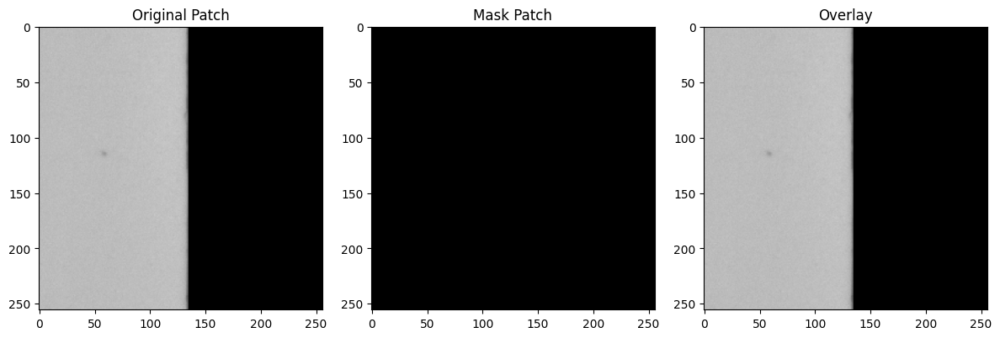

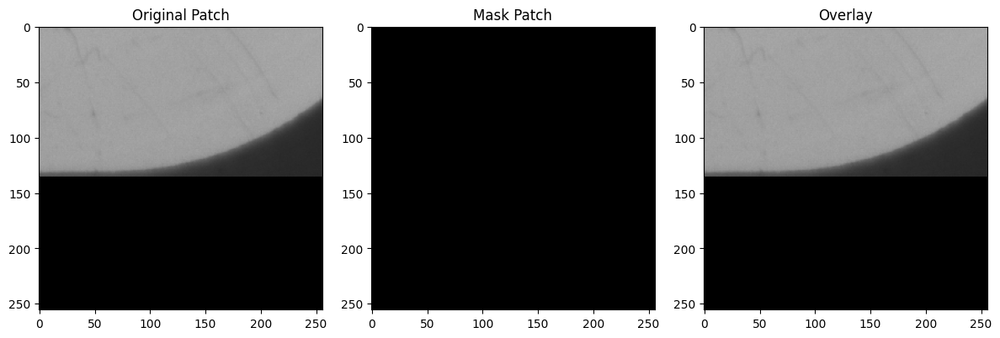

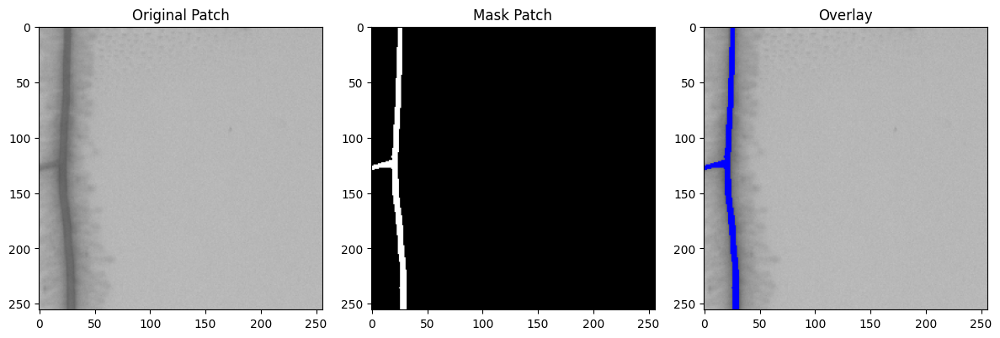

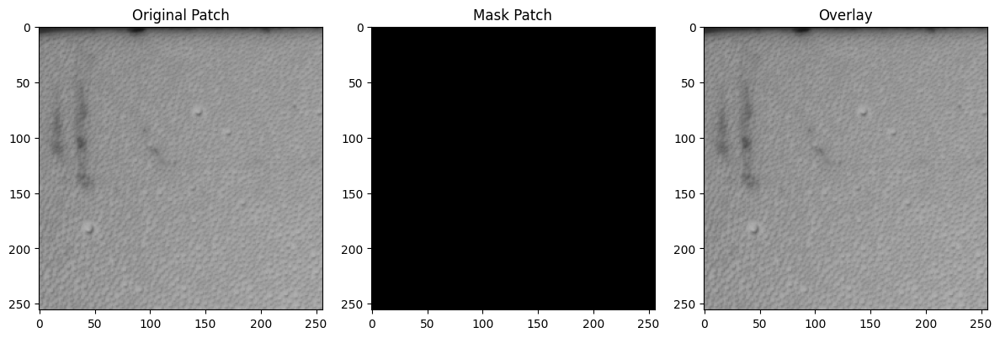

In [14]:
# Display 25 random patches for verification
for _ in range(25):
    display_random_patch(OUTPUT_DIR, dataset_type="train")

In [ ]:
## LAST ATTEMPT

In [1]:
import os
import cv2
import numpy as np
from patchify import patchify
from tqdm import tqdm
import matplotlib.pyplot as plt

# Constants
PATCH_SIZE = 256
DATASET_DIR_1 = "client_data/Y2B_23"
DATASET_DIR_2 = "client_data/Y2B_24"
OUTPUT_DIR = "dataset_patched_final"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Helper: Build mask index for Y2B_24 with nested folders
def build_mask_index(mask_dir):
    mask_index = {}
    for subfolder in os.listdir(mask_dir):
        subfolder_path = os.path.join(mask_dir, subfolder)
        for mask_name in os.listdir(subfolder_path):
            if "root_mask" in mask_name:
                base_name = mask_name.replace("_root_mask.tif", "")
                mask_index[base_name] = os.path.join(subfolder_path, mask_name)
    return mask_index

# Detect and crop Petri dishes
def detect_and_crop(image_path, mask_paths):
    image = cv2.imread(image_path)
    if image is None:
        return None, []

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.medianBlur(gray, 5)
    _, thresh = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return None, []

    x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
    size = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2
    x_start, y_start = x_center - size // 2, y_center - size // 2
    x_end, y_end = x_start + size, y_start + size

    cropped_image = image[max(0, y_start):min(image.shape[0], y_end),
                          max(0, x_start):min(image.shape[1], x_end)]
    cropped_masks = [cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)[max(0, y_start):min(image.shape[0], y_end),
                                                                max(0, x_start):min(image.shape[1], x_end)]
                     for mask_path in mask_paths]

    if all(np.count_nonzero(mask) == 0 for mask in cropped_masks):
        return None, []

    return cropped_image, cropped_masks

# Save all patches
def save_patches(image, masks, output_image_dir, output_mask_dir, base_name):
    height, width = image.shape[:2]
    pad_h = (PATCH_SIZE - height % PATCH_SIZE) % PATCH_SIZE
    pad_w = (PATCH_SIZE - width % PATCH_SIZE) % PATCH_SIZE

    image_padded = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
    masks_padded = [np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant') for mask in masks]

    image_patches = patchify(image_padded, (PATCH_SIZE, PATCH_SIZE, 3), step=PATCH_SIZE)
    mask_patches = [patchify(mask, (PATCH_SIZE, PATCH_SIZE), step=PATCH_SIZE) for mask in masks_padded]

    for i in range(image_patches.shape[0]):
        for j in range(image_patches.shape[1]):
            img_patch = image_patches[i, j, 0]
            mask_patch_combined = np.zeros((PATCH_SIZE, PATCH_SIZE), dtype=np.uint8)

            for mask_patch in mask_patches:
                mask_patch_combined = cv2.bitwise_or(mask_patch_combined, mask_patch[i, j])

            patch_name = f"{base_name}_{i}_{j}.png"
            cv2.imwrite(os.path.join(output_image_dir, patch_name), img_patch)
            cv2.imwrite(os.path.join(output_mask_dir, patch_name), mask_patch_combined)

# Process dataset
def process_dataset(images_dir, masks_dir, output_dir, dataset_type, mask_index=None, name_filter=None):
    output_image_dir = os.path.join(output_dir, f"{dataset_type}_images", dataset_type)
    output_mask_dir = os.path.join(output_dir, f"{dataset_type}_masks", dataset_type)
    os.makedirs(output_image_dir, exist_ok=True)
    os.makedirs(output_mask_dir, exist_ok=True)

    for image_name in tqdm(os.listdir(images_dir)):
        if not image_name.endswith(".png") or (name_filter and not image_name.startswith(name_filter)):
            continue

        base_name = os.path.splitext(image_name)[0]
        image_path = os.path.join(images_dir, image_name)

        if mask_index:
            mask_paths = [mask_index.get(base_name, "")]
        else:
            mask_paths = [os.path.join(masks_dir, f"{base_name}_root_mask.tif")]

        mask_paths = [path for path in mask_paths if os.path.exists(path)]
        if not mask_paths:
            continue

        cropped_image, cropped_masks = detect_and_crop(image_path, mask_paths)
        if cropped_image is not None:
            save_patches(cropped_image, cropped_masks, output_image_dir, output_mask_dir, base_name)

# Build mask index for Y2B_24
mask_index_Y2B_24 = build_mask_index(os.path.join(DATASET_DIR_2, "masks"))

# Process datasets
process_dataset(
    images_dir=os.path.join(DATASET_DIR_1, "images", "train"),
    masks_dir=os.path.join(DATASET_DIR_1, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train"
)
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="train",
    mask_index=mask_index_Y2B_24,
    name_filter="train_"
)
process_dataset(
    images_dir=os.path.join(DATASET_DIR_2, "images"),
    masks_dir=os.path.join(DATASET_DIR_2, "masks"),
    output_dir=OUTPUT_DIR,
    dataset_type="val",
    mask_index=mask_index_Y2B_24,
    name_filter="val_"
)

100%|██████████| 450/450 [00:34<00:00, 13.02it/s]


In [2]:
# Display 25 random patches for verification
for _ in range(25):
    display_random_patch(OUTPUT_DIR, dataset_type="train")

NameError: name 'display_random_patch' is not defined

In [3]:
# Sanity checks
def sanity_checks(output_dir, dataset_type="train"):
    image_dir = os.path.join(output_dir, f"{dataset_type}_images", dataset_type)
    mask_dir = os.path.join(output_dir, f"{dataset_type}_masks", dataset_type)

    for i, image_name in enumerate(os.listdir(image_dir)):
        if i == 20:
            break
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, image_name)

        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        assert image.shape[:2] == mask.shape, f"Dimension mismatch: {image_name}"
        assert image.shape[:2] == (PATCH_SIZE, PATCH_SIZE), f"Incorrect patch size: {image_name}"
        assert np.min(image) >= 0 and np.max(image) <= 255, f"Invalid pixel values: {image_name}"
        assert np.min(mask) >= 0 and np.max(mask) <= 255, f"Invalid mask values: {image_name}"

    print(f"Sanity checks passed for {dataset_type} dataset.")

sanity_checks(OUTPUT_DIR, "train")
sanity_checks(OUTPUT_DIR, "val")

Sanity checks passed for train dataset.
Sanity checks passed for val dataset.


In [ ]:
### Final version

In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from patchify import patchify

# Constants
PATCH_SIZE = 256
DATASET_DIR = "client_data"
OUTPUT_DIR = "dataset_patched_final"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Function to detect and crop Petri dishes

def detect_and_crop_petri_dish_with_masks(image_path, mask_paths):
    image = cv2.imread(image_path, 0)  # Grayscale image
    original_image = cv2.imread(image_path)  # Original image for cropping

    blurred = cv2.medianBlur(image, 5)
    _, output_im = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY)

    kernel = np.ones((9, 9), np.uint8)
    im_d = cv2.dilate(output_im, kernel, iterations=3)
    im_closing = cv2.erode(im_d, kernel, iterations=4)

    contours, _ = cv2.findContours(im_closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return None, []

    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)

    size = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2
    x_start, y_start = x_center - size // 2, y_center - size // 2
    x_end, y_end = x_start + size, y_start + size

    cropped_image = original_image[max(0, y_start):min(image.shape[0], y_end), 
                                   max(0, x_start):min(image.shape[1], x_end)]

    cropped_masks = []
    for mask_path in mask_paths:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        cropped_mask = mask[max(0, y_start):min(mask.shape[0], y_end), 
                            max(0, x_start):min(mask.shape[1], x_end)]
        cropped_masks.append(cropped_mask)

    return cropped_image, cropped_masks

# Function to create patches and save them
def create_patches_and_save(image_dir, mask_dir, output_dir, patch_size, dataset_type):
    os.makedirs(os.path.join(output_dir, f"{dataset_type}_images/{dataset_type}"), exist_ok=True)
    os.makedirs(os.path.join(output_dir, f"{dataset_type}_masks/{dataset_type}"), exist_ok=True)

    for image_name in tqdm(os.listdir(image_dir)):
        if not image_name.endswith(".png"):
            continue

        if dataset_type == "val" and not image_name.startswith("val_"):
            continue

        if dataset_type == "train" and image_name.startswith("val_"):
            continue

        image_path = os.path.join(image_dir, image_name)
        base_name = image_name[:-4]

        mask_paths = []
        if "Y2B_23" in mask_dir:
            mask_path = os.path.join(mask_dir, f"{base_name}_root_mask.tif")
            if os.path.exists(mask_path):
                mask_paths.append(mask_path)
        elif "Y2B_24" in mask_dir:
            for teacher_folder in os.listdir(mask_dir):
                teacher_folder_path = os.path.join(mask_dir, teacher_folder)
                if os.path.isdir(teacher_folder_path):
                    mask_path = os.path.join(teacher_folder_path, f"{base_name}_root_mask.tif")
                    if os.path.exists(mask_path):
                        mask_paths.append(mask_path)

        mask_paths = [path for path in mask_paths if os.path.exists(path)]

        if not mask_paths:
            continue

        cropped_image, cropped_masks = detect_and_crop_petri_dish_with_masks(image_path, mask_paths)

        if cropped_image is None or not cropped_masks:
            continue

        height, width = cropped_image.shape[:2]
        pad_h = (patch_size - height % patch_size) % patch_size
        pad_w = (patch_size - width % patch_size) % patch_size

        padded_image = np.pad(cropped_image, ((0, pad_h), (0, pad_w), (0, 0)), mode='constant')
        padded_masks = [
            np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant') for mask in cropped_masks
        ]

        image_patches = patchify(padded_image, (patch_size, patch_size, 3), step=patch_size)
        mask_patches = [patchify(mask, (patch_size, patch_size), step=patch_size) for mask in padded_masks]

        for i in range(image_patches.shape[0]):
            for j in range(image_patches.shape[1]):
                image_patch = image_patches[i, j, 0]
                combined_mask_patch = np.zeros((patch_size, patch_size), dtype=np.uint8)

                for mask_patch in mask_patches:
                    combined_mask_patch = cv2.bitwise_or(combined_mask_patch, mask_patch[i, j])

                combined_mask_patch = (combined_mask_patch * 255).astype(np.uint8)

                patch_name = f"{base_name}_{i}_{j}.png"

                cv2.imwrite(
                    os.path.join(output_dir, f"{dataset_type}_images/{dataset_type}", patch_name), image_patch
                )
                cv2.imwrite(
                    os.path.join(output_dir, f"{dataset_type}_masks/{dataset_type}", patch_name), combined_mask_patch
                )

# Processing datasets
DATASET_Y2B23 = os.path.join(DATASET_DIR, "Y2B_23")
DATASET_Y2B24 = os.path.join(DATASET_DIR, "Y2B_24")

create_patches_and_save(
    os.path.join(DATASET_Y2B23, "images/train"),
    os.path.join(DATASET_Y2B23, "masks"),
    OUTPUT_DIR, PATCH_SIZE, "train"
)

create_patches_and_save(
    os.path.join(DATASET_Y2B24, "images"),
    os.path.join(DATASET_Y2B24, "masks"),
    OUTPUT_DIR, PATCH_SIZE, "train"
)

create_patches_and_save(
    os.path.join(DATASET_Y2B24, "images"),
    os.path.join(DATASET_Y2B24, "masks"),
    OUTPUT_DIR, PATCH_SIZE, "val"
)

100%|██████████| 450/450 [00:52<00:00,  8.57it/s]


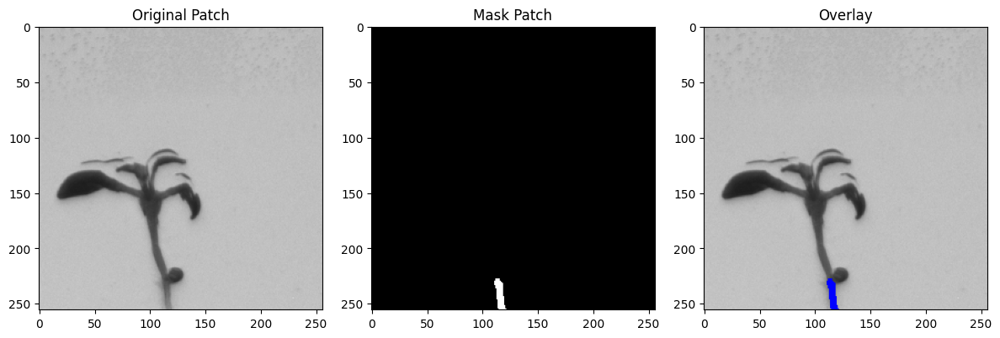

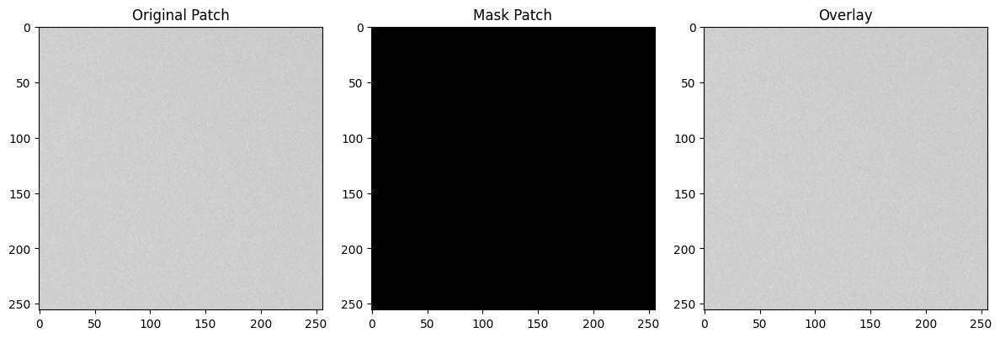

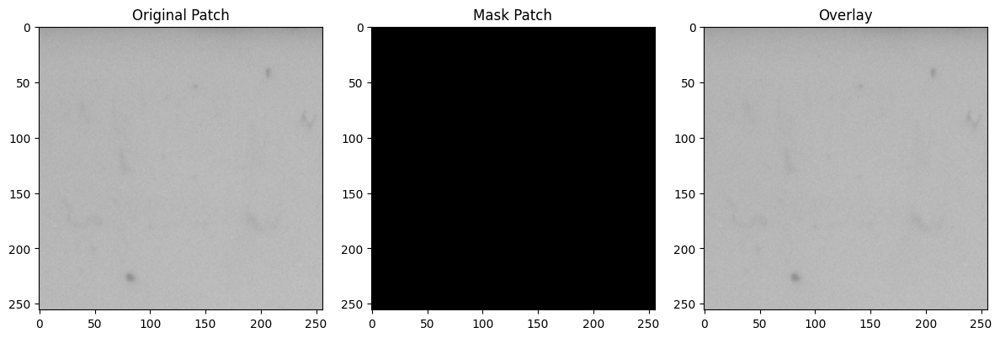

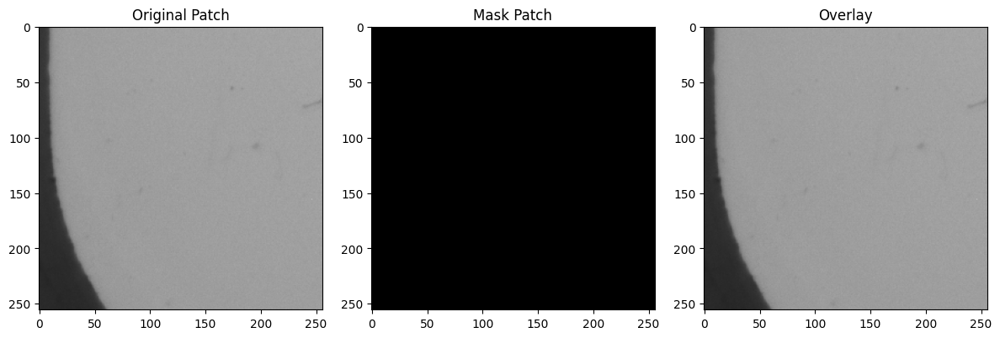

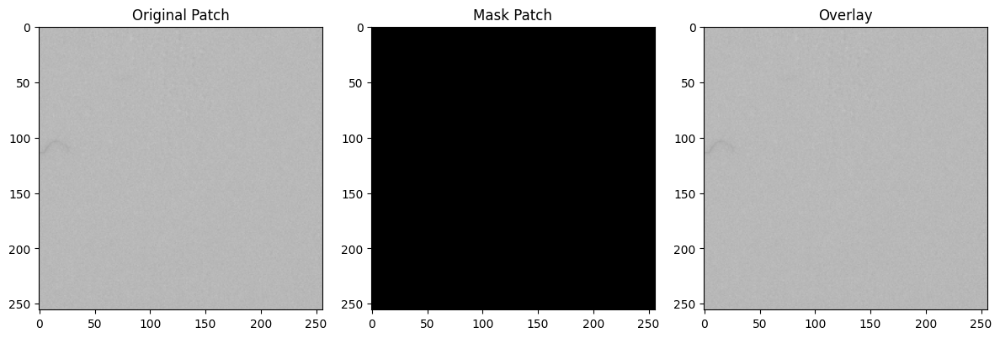

...

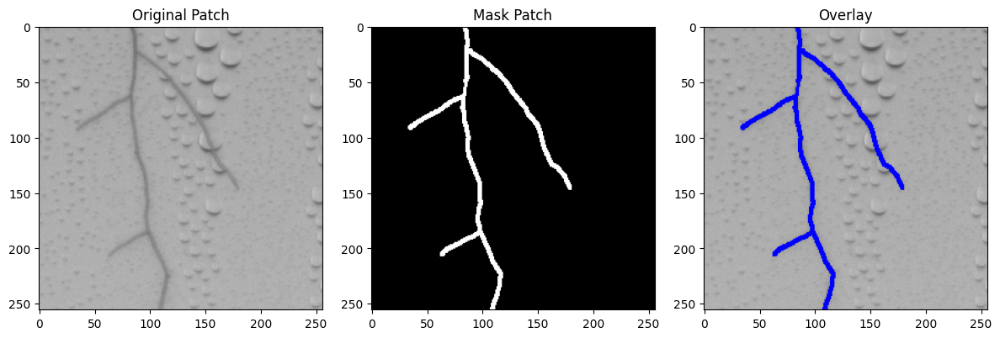

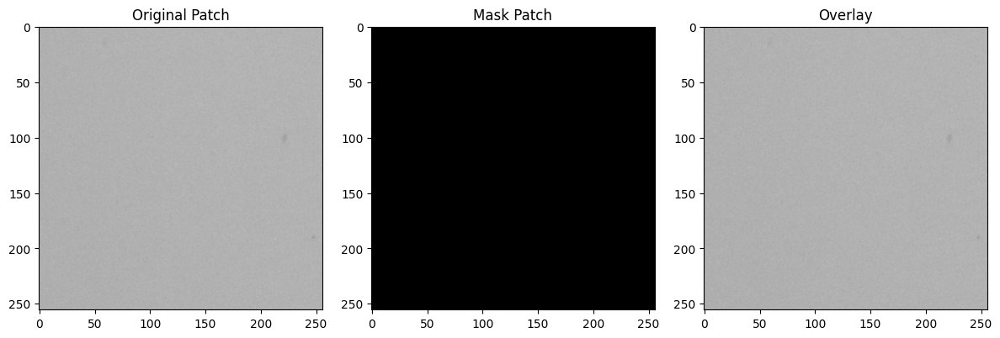

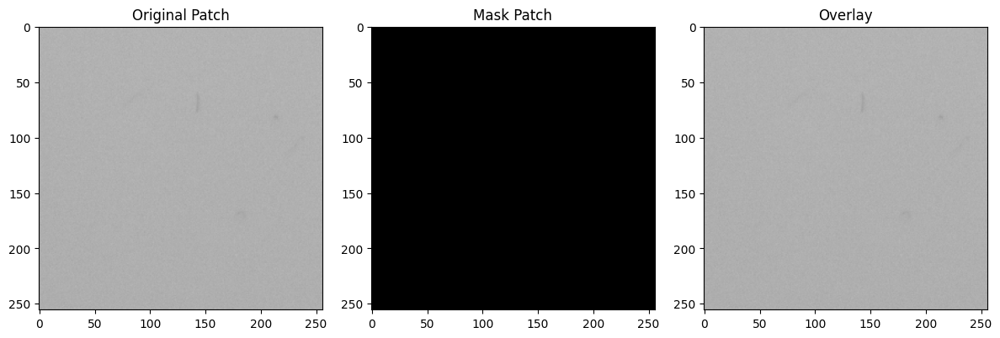

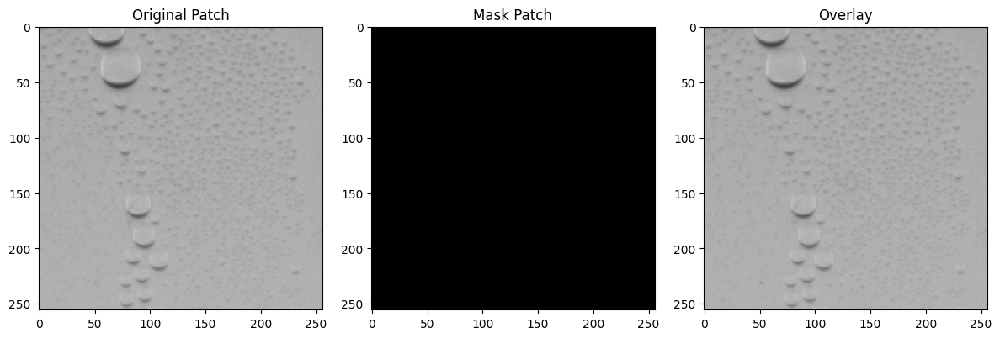

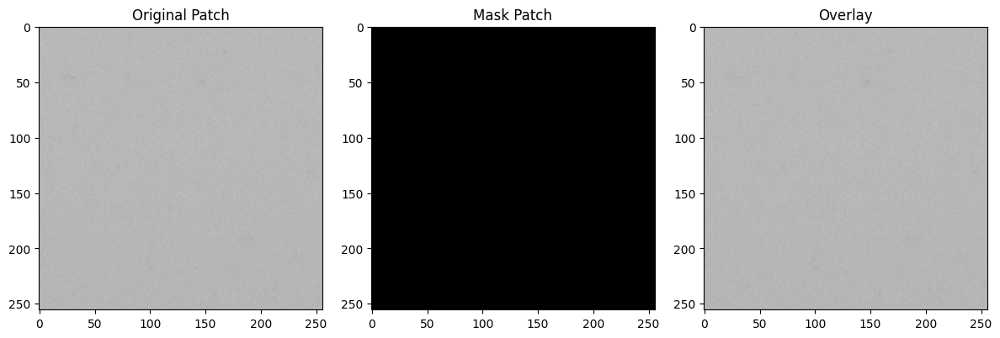

In [7]:
# Display random patches
def display_random_patches(output_dir, dataset_type="train"):
    image_dir = os.path.join(output_dir, f"{dataset_type}_images/{dataset_type}")
    mask_dir = os.path.join(output_dir, f"{dataset_type}_masks/{dataset_type}")

    for _ in range(10):
        random_image_name = np.random.choice(os.listdir(image_dir))
        image_path = os.path.join(image_dir, random_image_name)
        mask_path = os.path.join(mask_dir, random_image_name)

        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Overlay
        overlay = image.copy()
        overlay[mask > 0] = [255, 0, 0]  # Red mask

        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[0].set_title("Original Patch")
        axes[1].imshow(mask, cmap="gray")
        axes[1].set_title("Mask Patch")
        axes[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        axes[2].set_title("Overlay")
        plt.tight_layout()
        plt.show()

display_random_patches(OUTPUT_DIR, "train")
display_random_patches(OUTPUT_DIR, "val")

In [6]:
# Sanity checks
train_image_dir = os.path.join(OUTPUT_DIR, "train_images/train")
train_mask_dir = os.path.join(OUTPUT_DIR, "train_masks/train")

for i, image_name in enumerate(os.listdir(train_image_dir)):
    if i == 20:
        break
    image_path = os.path.join(train_image_dir, image_name)
    mask_path = os.path.join(train_mask_dir, image_name)

    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    assert image.shape[:2] == mask.shape, f"Mismatch in dimensions for {image_name}"
    assert image.shape[:2] == (PATCH_SIZE, PATCH_SIZE), f"Incorrect patch size for {image_name}"
    assert np.min(image) >= 0 and np.max(image) <= 255, f"Image pixel values out of range in {image_name}"
    assert np.min(mask) >= 0 and np.max(mask) <= 255, f"Mask pixel values out of range in {image_name}"

val_image_dir = os.path.join(OUTPUT_DIR, "val_images/val")
val_mask_dir = os.path.join(OUTPUT_DIR, "val_masks/val")

for i, image_name in enumerate(os.listdir(val_image_dir)):
    if i == 20:
        break
    image_path = os.path.join(val_image_dir, image_name)
    mask_path = os.path.join(val_mask_dir, image_name)

    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    assert image.shape[:2] == mask.shape, f"Mismatch in dimensions for {image_name}"
    assert image.shape[:2] == (PATCH_SIZE, PATCH_SIZE), f"Incorrect patch size for {image_name}"
    assert np.min(image) >= 0 and np.max(image) <= 255, f"Image pixel values out of range in {image_name}"
    assert np.min(mask) >= 0 and np.max(mask) <= 255, f"Mask pixel values out of range in {image_name}"

print("Sanity checks passed: All patches are correctly aligned and sized.")

Sanity checks passed: All patches are correctly aligned and sized.
